**Verify NVIDIA GPU Availability**

Make sure you're using a GPU-equipped machine by going to "Runtime" -> "Change runtime type" in the top menu bar, and then selecting one of the GPU options in the Hardware accelerator section. Click Play on the following code block to verify that the NVIDIA GPU is present and ready for training.

In [13]:
!nvidia-smi

Thu Jul  3 19:11:05 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Mount google drive**

This is the placeholder where annotated data is supposed to be uploaded. In my case the folder name with annotated data (exported from label studio) is called `project-2-at-2025-07-02-07-58-190786e0`

In [14]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**Copy data to colab notebook files system**

In [15]:
!cp -r /content/gdrive/MyDrive/project-2-at-2025-07-02-07-58-190786e0 /content

**Dataset structure and reasoning**

For the simplicity and compiling YOLO expected format, the dataset structure gonna be managed with custom `TrainValidationSplitManager`and constructed as shown below. `Train/Validation split` fraction gonna be `90/10` accordingly.

```text
dataset
  train
    images
      47e625d4-18_16_56.jpg
      ...
    labels
      47e625d4-18_16_56.txt
      ...
  validation
    images
      ...
    labels
      ...

train       - for model training purpose
validation  - for model validation purpose

Note:
  convention is made up the image name matches according label file;
```


In [16]:
from pathlib import Path
from shutil import copy2
from typing import List

import random


class TrainValidationSplitManager:
    """
    Split dataset of the following format:
      <path>/images/*.jpg
      <path>/labels/*.txt  (YOLO-annotations)
    on /content/dataset/{train,validation}/{images,labels}.
    """

    def __init__(self, path: str, fraction: float = 0.8) -> None:
        self.__source = Path(path).expanduser().resolve()
        self.__train_images = Path("/content/dataset/train/images")
        self.__train_labels = Path("/content/dataset/train/labels")
        self.__val_images = Path("/content/dataset/validation/images")
        self.__val_labels = Path("/content/dataset/validation/labels")

        if not (0.01 <= fraction <= 0.99):
            raise ValueError("`fraction` should be between 0.01 and 0.99")
        self.__fraction = fraction

    @staticmethod
    def _exists(path: Path) -> bool:
        return path.exists()

    @staticmethod
    def _mkdir(path: Path) -> None:
        path.mkdir(parents=True, exist_ok=True)

    def _prepare_folders(self) -> None:
        for p in (
            self.__train_images,
            self.__train_labels,
            self.__val_images,
            self.__val_labels,
        ):
            self._mkdir(p)

    def _get_source_images(self) -> List[Path]:
        return sorted(Path(self.__source / "images").rglob("*.*"))

    def _get_source_labels(self) -> List[Path]:
        return sorted(Path(self.__source / "labels").rglob("*.txt"))

    @staticmethod
    def _copy(src: Path, dst_dir: Path) -> Path:
        dst = dst_dir / src.name
        copy2(src, dst)
        return dst

    def split(self, seed: int | None = None) -> None:
        """
        Copies files, splitting on train/validation.

        Args:
          seed: for deterministic split
        """
        if not self._exists(self.__source):
            raise FileNotFoundError(f"Исходная папка «{self.__source}» не найдена")

        # 1. Create/clean folders
        self._prepare_folders()

        # 2. Collect list of files
        images = self._get_source_images()
        labels_dict = {p.stem: p for p in self._get_source_labels()}

        if not images:
            raise RuntimeError("No files in folder images/")

        # 3. Shuffle and count dataset size
        if seed is not None: random.seed(seed)
        random.shuffle(images)

        train_count = int(len(images) * self.__fraction)
        val_count = len(images) - train_count

        train_set = images[:train_count]
        val_set = images[train_count:]

        # 4. Compose coping
        for subset, img_dst, lbl_dst in [
            (train_set, self.__train_images, self.__train_labels),
            (val_set, self.__val_images, self.__val_labels),
        ]:
            for img_path in subset:
                self._copy(img_path, img_dst)

                label_path = labels_dict.get(img_path.stem)
                if label_path:
                    self._copy(label_path, lbl_dst)
                # если метки нет, считаем изображение background — пропускаем

        print(
            f"Ready! Train: {train_count} images, "
            f"Validation: {val_count} images."
        )

In [17]:
manager = TrainValidationSplitManager(
    path="/content/project-2-at-2025-07-02-07-58-190786e0",
    fraction=0.9,
)
manager.split(seed=42)

Ready! Train: 12 images, Validation: 2 images.


**Configurations for YOLO**

On top of the dataset which was generated, we need to create the Ultralytics training configuration YAML file. We gonna manage configuration creation with custom `DataYAMLGenerator` class.


This file specifies the location of your train and validation data, and it also defines the model's classes. An example configuration file model is available [here](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco128.yaml).


Heres' the resulting `configuration.yaml` file:
```text
  path: /content/dataset
  train: train/images
  val: validation/images
  nc: 6
  names:
    - жидкое
    - мясо
    - напиток
    - салат
    - соус
    - хлеб
```

In [18]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.9 MB/s eta 0:00:00


In [19]:
import yaml
import os
from pathlib import Path
from typing import List


class DataYAMLGenerator:
    def __init__(self, classes_path: str, output_yaml_path: str, root_path: str = '/content/dataset') -> None:
        self.classes_path = Path(classes_path)
        self.output_yaml_path = Path(output_yaml_path)
        self.root_path = root_path
        self.train_dir = 'train/images'
        self.val_dir = 'validation/images'
        self.classes: List[str] = []

    def read_classes(self) -> None:
        if not self.classes_path.exists():
            raise FileNotFoundError(
                f"'classes.txt' not found at {self.classes_path}. "
                f"Please create a label map file at this location."
            )

        with self.classes_path.open('r') as f:
            self.classes = [line.strip() for line in f if line.strip()]

        if not self.classes:
            raise ValueError("No valid class names found in classes.txt")

    def generate_yaml_data(self) -> dict:
        return {
            'path': self.root_path,
            'train': self.train_dir,
            'val': self.val_dir,
            'nc': len(self.classes),
            'names': self.classes
        }

    def write_yaml(self) -> None:
        data = self.generate_yaml_data()
        with self.output_yaml_path.open('w') as f:
            yaml.dump(data, f, sort_keys=False, allow_unicode=True)
        print(f'Created config file at {self.output_yaml_path}')

    def run(self) -> None:
        self.read_classes()
        self.write_yaml()

In [20]:
generator = DataYAMLGenerator(
    classes_path='/content/project-2-at-2025-07-02-07-58-190786e0/classes.txt',
    output_yaml_path='/content/configuration.yaml'
)

generator.run()
os.system('cat /content/configuration.yaml')

Created config file at /content/configuration.yaml


0

## Training | Testing Overview
It was performed 2 experiments with same models, epochs and resolution parameters, except augmentations. According to the experiments results, we might see introducing out of the box YOLO augmentations significantly increased the inference performance, thus it was decided not to step in models paramters improvements.

---

### Model
There are several YOLO11 models sizes available to train, including `yolo11n.pt`, `yolo11s.pt`, `yolo11m.pt`, `yolo11l.pt`, and `yolo11xl.pt`. Larger models run slower but have higher accuracy, while smaller models run faster but have lower accuracy.


### Number of epochs (`epochs`)

In machine learning, one “epoch” is one single pass through the full training dataset. Setting the number of epochs dictates how long the model will train for. The best amount of epochs to use depends on the size of the dataset and the model architecture. If dataset has less than 200 images, a good starting point is 60 epochs. Otherwise, if dataset has more than 200 images, a good starting point is 40 epochs.


### Resolution (`imgsz`)

YOLO models are typically trained and inferenced at a 640x640 resolution. However, if want model to run faster or know you will be working with low-resolution images, try using a lower resolution like 480x480.


### Augmentations
By default YOLO utilises `Albumentations` for performing augmentations, thus no need to augment images manually.


## Training Parameters
#### Experiment 1
- *model*: yolo11s.pt
```text
Parameters: approximately 21.5 million
FLOPs: around 9.4 G FLOPs (per inference at 640×640)
```
- *epochs*: 60
- *resolution*: 640x640
- *augmentations*: None

#### Experiment 2
- *model*: yolo11s.pt
```text
Parameters: approximately 21.5 million
FLOPs: around 9.4 G FLOPs (per inference at 640×640)
```
- *epochs*: 60
- *resolution*: 640x640
- *augmentations* ([more about different augmentations](https://docs.ultralytics.com/guides/yolo-data-augmentation/#using-a-configuration-file)):
  - hsv_*: color shifts
  - degrees, translate, scale, shear, perspective: geometric transforms
  - flipud, fliplr: flipping
  - mosaic, mixup, copy_paste: complex YOLO-specific augmentations


# Experiment 1

- *model*: yolo11s.pt
```text
Parameters: approximately 21.5 million
FLOPs: around 9.4 G FLOPs (per inference at 640×640)
```
- *epochs*: 60
- *resolution*: 640x640
- *augmentations*: None


In [21]:
# train model
!yolo detect train data=/content/configuration.yaml model=yolo11s.pt epochs=60 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 18.4M/18.4M [00:00<00:00, 205MB/s]
Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/configuration.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8

In [22]:
# inference
!yolo detect predict model=runs/detect/train/weights/best.pt source=dataset/validation/images save=True

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs

image 1/3 /content/dataset/validation/images/208cd0d8-18_19_18.jpg: 384x640 3 напитокs, 59.8ms
image 2/3 /content/dataset/validation/images/47d72ed9-18_17_08.jpg: 384x640 3 жидкоеs, 1 мясо, 1 напиток, 4 салатs, 3 соусs, 2 хлебs, 10.9ms
image 3/3 /content/dataset/validation/images/d0ff47c6-18_16_55.jpg: 384x640 2 жидкоеs, 1 мясо, 1 напиток, 3 салатs, 2 соусs, 2 хлебs, 10.9ms
Speed: 2.6ms preprocess, 27.2ms inference, 45.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


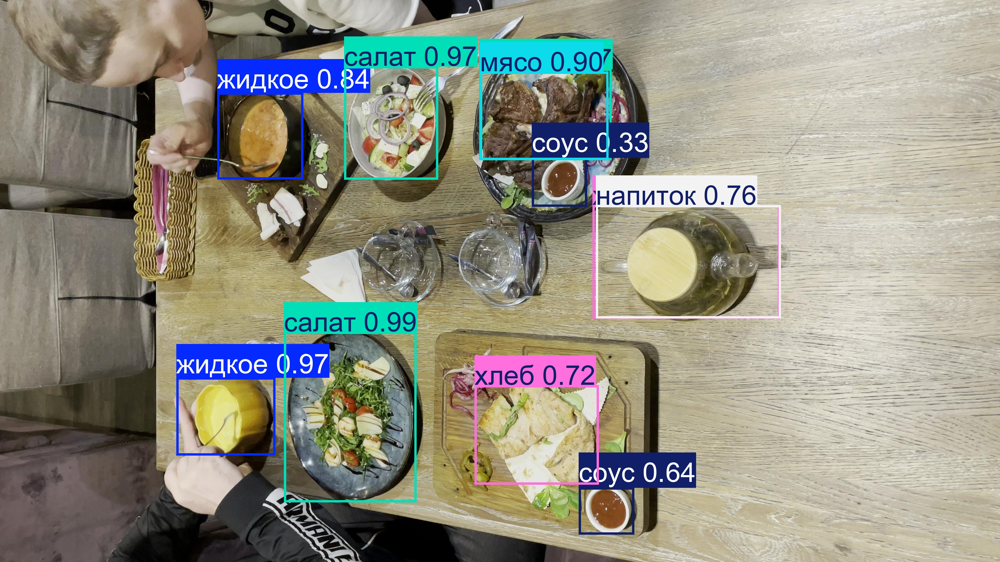

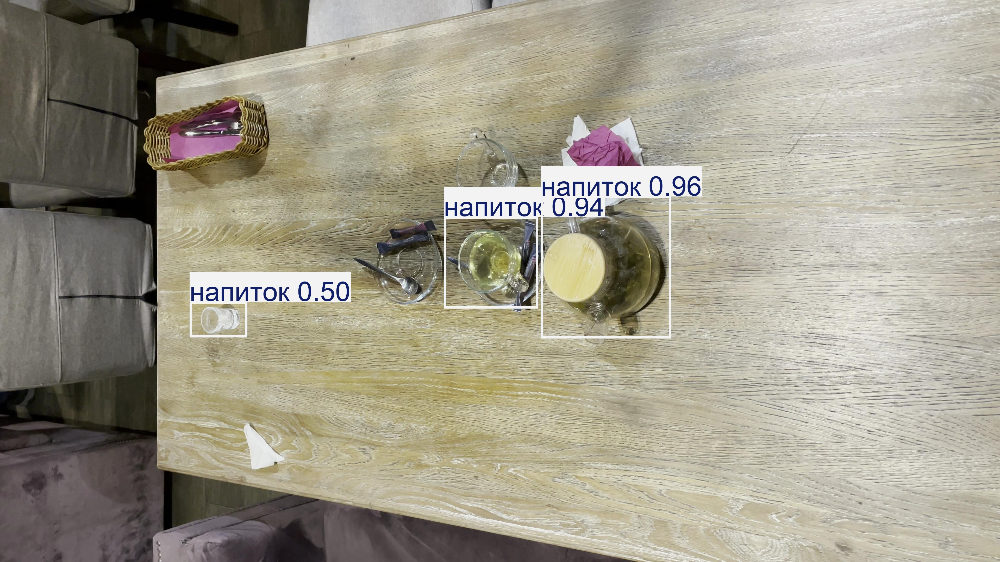

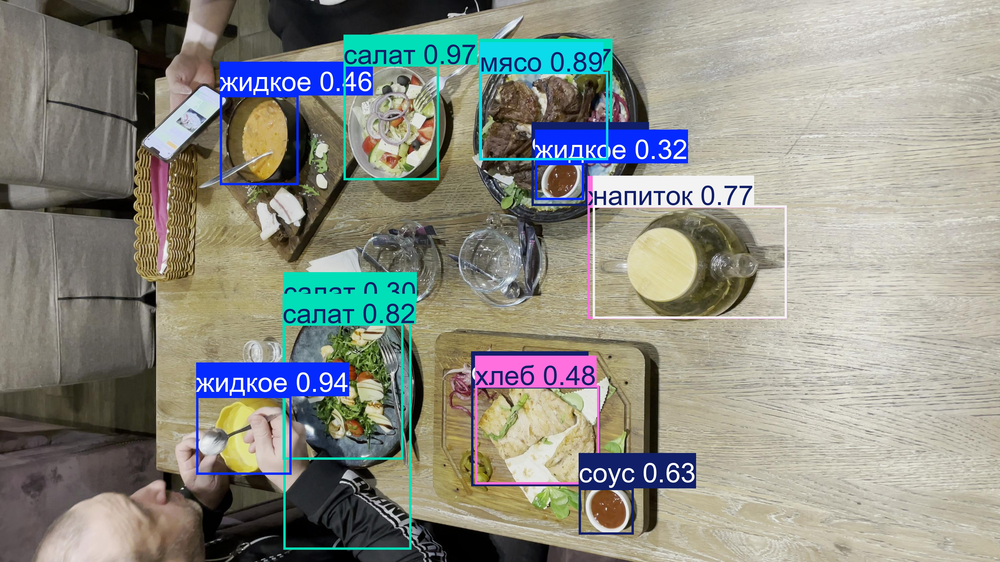

In [23]:
# visualise results on validation images
from IPython.display import Image, display

directory = Path("/content/runs/detect/predict")
images = list(directory.glob("*"))

for image in images:
  display(Image(filename=image, height=300))
  print("\n")

# Experiment 2

- *model*: yolo11s.pt
```text
Parameters: approximately 21.5 million
FLOPs: around 9.4 G FLOPs (per inference at 640×640)
```
- *epochs*: 60
- *resolution*: 640x640
- *augmentations* ([more about different augmentations](https://docs.ultralytics.com/guides/yolo-data-augmentation/#using-a-configuration-file)):
  - hsv_*: color shifts
  - degrees, translate, scale, shear, perspective: geometric transforms
  - flipud, fliplr: flipping
  - mosaic, mixup, copy_paste: complex YOLO-specific augmentations

In [24]:
# train model
!yolo detect train data=/content/configuration.yaml model=yolo11s.pt epochs=60 imgsz=640 \
  hsv_h=0.015 hsv_s=0.7 hsv_v=0.4 degrees=10 translate=0.1 scale=0.5 shear=2 \
  perspective=0.001 flipud=0.5 fliplr=0.5 mosaic=1.0 mixup=0.2 copy_paste=0.1

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/configuration.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.001, plots=True, pose=12.0, pretraine

In [27]:
# inference
!yolo detect predict model=runs/detect/train2/weights/best.pt source=dataset/validation/images save=True

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs

image 1/3 /content/dataset/validation/images/208cd0d8-18_19_18.jpg: 384x640 4 напитокs, 48.1ms
image 2/3 /content/dataset/validation/images/47d72ed9-18_17_08.jpg: 384x640 1 жидкое, 2 мясоs, 2 салатs, 4 соусs, 3 хлебs, 10.9ms
image 3/3 /content/dataset/validation/images/d0ff47c6-18_16_55.jpg: 384x640 1 жидкое, 3 мясоs, 2 салатs, 5 соусs, 2 хлебs, 10.9ms
Speed: 2.7ms preprocess, 23.3ms inference, 46.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


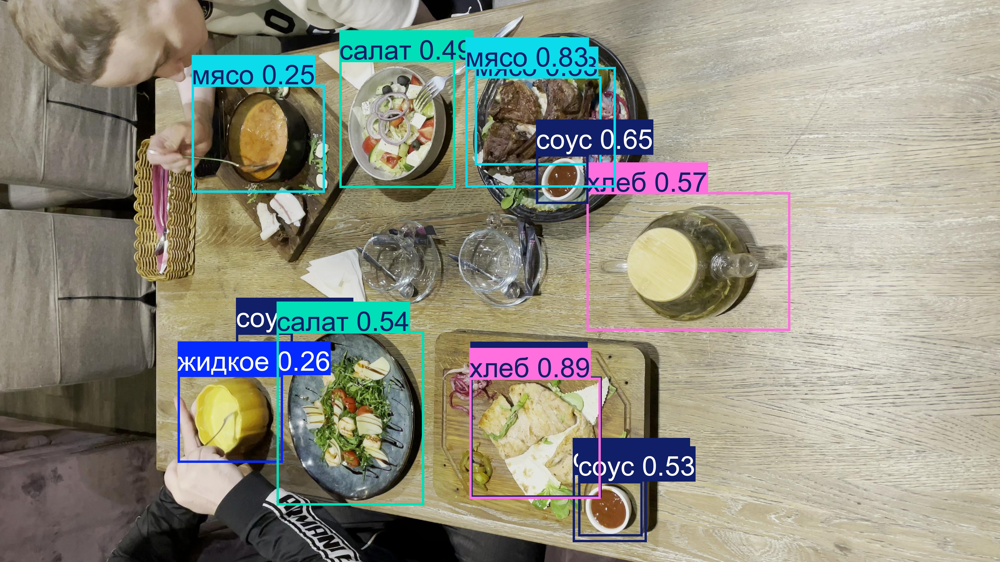

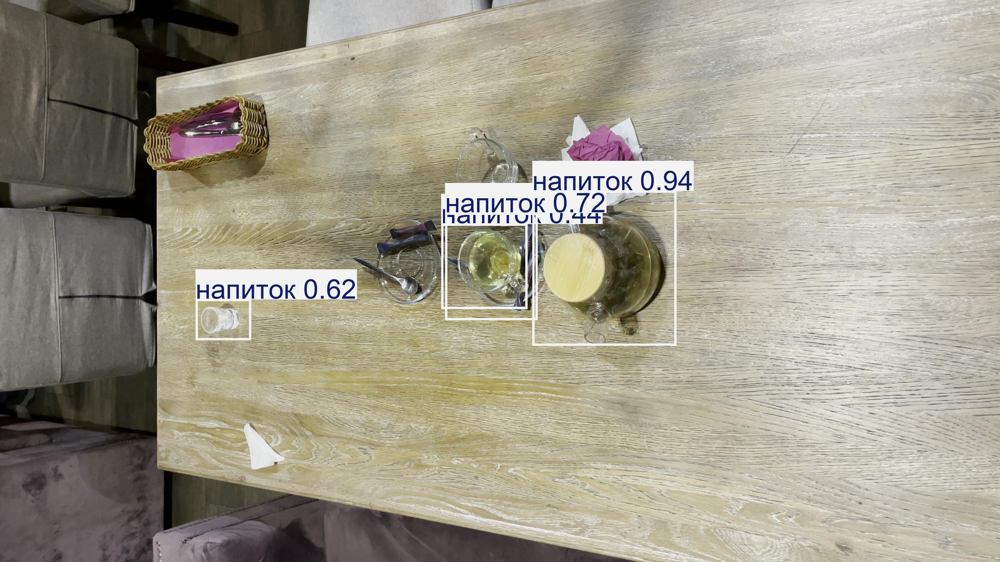

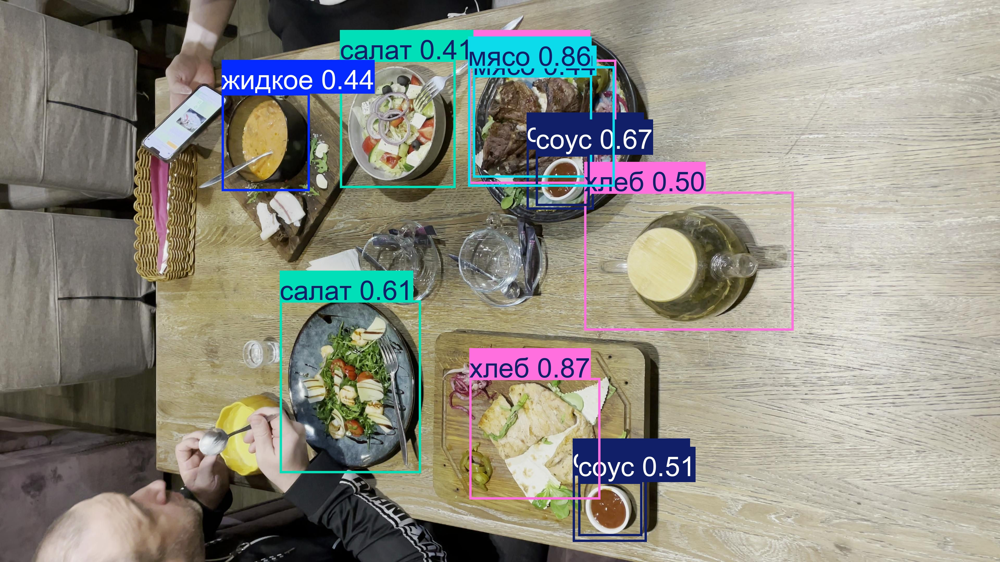

In [28]:
# visualise results on validation images
from IPython.display import Image, display

directory = Path("/content/runs/detect/predict2")
images = list(directory.glob("*"))

for image in images:
  display(Image(filename=image, height=300))
  print("\n")